Talk about the test here

Talk about Image below here...

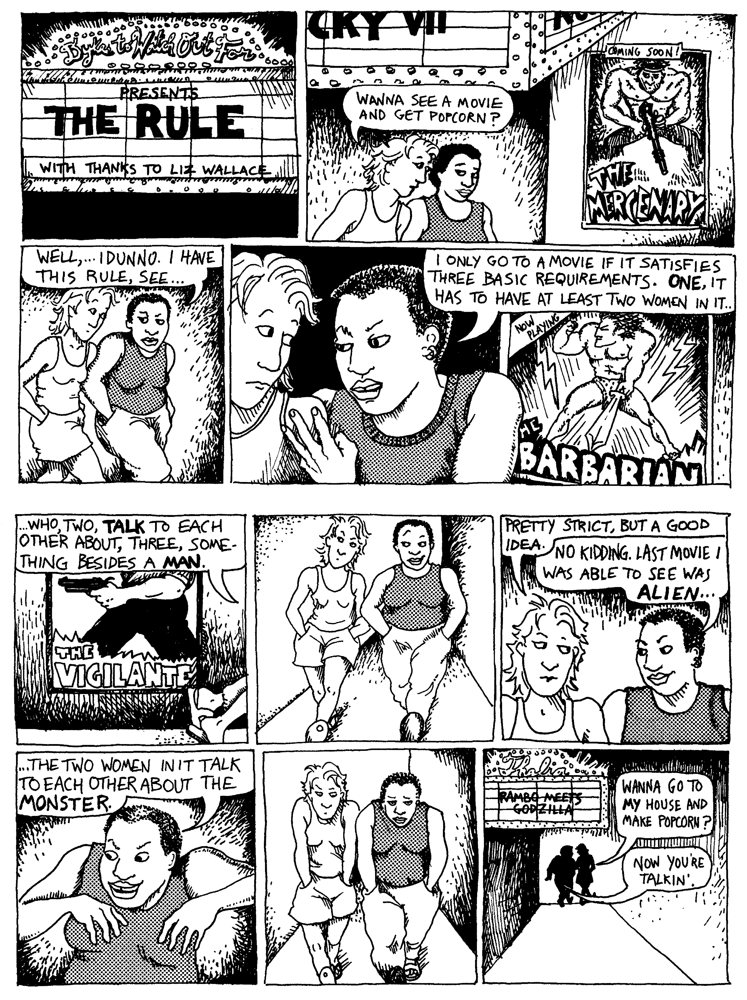

In [8]:
from IPython.display import Image
Image(filename='./rule.jpg',width = 600, height = 300)

So here we go... first I'll import most, but not all, of the required libraries for this project.

In [2]:
import urllib, json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.offline as py
import plotly.graph_objs as go
import cufflinks as cf
from jupyterthemes import jtplot
jtplot.style(theme='monokai')

cf.go_offline() 
py.init_notebook_mode()

%matplotlib inline

Talk about making dataframe and head,tail,and shape.

In [3]:
df = pd.read_json('http://bechdeltest.com/api/v1/getAllMovies')
df.rename(columns={'rating':'Score'}, inplace=True)

df.head()

,id,title,imdbid,Score,year
0,8040,Roundhay Garden Scene,0392728,0,1888
1,5433,Pauvre Pierrot,0000003,0,1892
2,6200,"Execution of Mary, Queen of Scots, The",0132134,0,1895
3,5444,Tables Turned on the Gardener,0000014,0,1895
4,5406,Une nuit terrible,0000131,0,1896


In [4]:
df.tail()

,id,title,imdbid,Score,year
8569,8859,"Marijuana Conspiracy , The",8461042,3,2020
8570,8994,"Rhythm Section, The",7134096,2,2020
8571,9071,Bad Boys For Life,1502397,2,2020
8572,9008,Birds of Prey,7713068,3,2020
8573,9144,Never Ricking Rick,10655686,1,2020


In [5]:
df.shape

(8574, 5)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8574 entries, 0 to 8573
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      8574 non-null   int64 
 1   title   8574 non-null   object
 2   imdbid  8574 non-null   object
 3   Score   8574 non-null   int64 
 4   year    8574 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 335.0+ KB


In [7]:
#df['year'] = pd.to_datetime(df['year'], format='%Y')
#df['Score'] = pd.Categorical(df['Score'], ordered=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8574 entries, 0 to 8573
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      8574 non-null   int64 
 1   title   8574 non-null   object
 2   imdbid  8574 non-null   object
 3   Score   8574 non-null   int64 
 4   year    8574 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 335.0+ KB


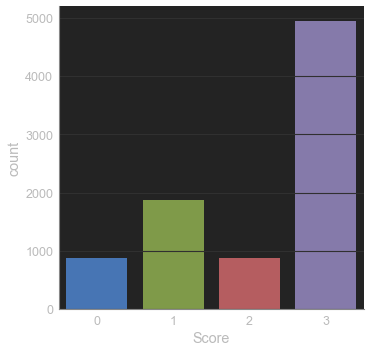

In [8]:
sns.catplot(x='Score', kind="count", data=df)

In [9]:
rating = pd.read_csv("ratingIMDB.tsv", sep='\t')

rating.tail()

,tconst,averageRating,numVotes
1089159,tt9916580,7.2,5
1089160,tt9916690,6.6,5
1089161,tt9916720,6.0,66
1089162,tt9916766,6.9,14
1089163,tt9916778,7.3,24


In [10]:
basic = pd.read_csv("basicIMDB.tsv", sep='\t', low_memory=False)

In [11]:
basic.head()

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres
0,tt0000001,short,Carmencita,Carmencita,0,1894,\N,1,"Documentary,Short"
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892,\N,5,"Animation,Short"
2,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0,1892,\N,4,"Animation,Comedy,Romance"
3,tt0000004,short,Un bon bock,Un bon bock,0,1892,\N,12,"Animation,Short"
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893,\N,1,"Comedy,Short"


In [12]:

#making a function to have a pass/fail column added.

li = []
for i in df['Score']:
    if i == 3:
        li.append(1)
    else:
        li.append(0)
df['pass_test'] = li


#rating = pd.read_csv("ratingIMDB.tsv", sep='\t')
#imdbRating = rating[['title','rating']]

data = pd.merge(basic, rating, on='tconst')

In [13]:
data.head()

,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
0,tt0000001,short,Carmencita,Carmencita,0,1894,\N,1,"Documentary,Short",5.6,1657
1,tt0000002,short,Le clown et ses chiens,Le clown et ses chiens,0,1892,\N,5,"Animation,Short",6.1,202
2,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0,1892,\N,4,"Animation,Comedy,Romance",6.5,1370
3,tt0000004,short,Un bon bock,Un bon bock,0,1892,\N,12,"Animation,Short",6.2,122
4,tt0000005,short,Blacksmith Scene,Blacksmith Scene,0,1893,\N,1,"Comedy,Short",6.2,2157


In [14]:
df = pd.merge(df, data, how='left', left_on=['title'], right_on=['primaryTitle'])


AWESOME POSSUM!!! now we have all the data and info we need to start doing some interesting and accurate analysis!


In [15]:
dfSlim = df.drop(columns=['originalTitle','titleType','isAdult','endYear','numVotes','year','id','tconst','primaryTitle','genres','averageRating','runtimeMinutes','pass_test','imdbid'])
dfDrop = dfSlim.dropna()

In [16]:
dfDrop.head()

,title,Score,startYear
0,Roundhay Garden Scene,0,1888
1,Pauvre Pierrot,0,1892
8,Four Heads Are Better Than One,0,1898
9,Four Heads Are Better Than One,0,2007
12,Cinderella,3,1898


In [17]:
dfDrop['Score'] = pd.Categorical(dfDrop['Score'], ordered=True)

In [18]:
dfDrop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28298 entries, 0 to 31199
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   title      28298 non-null  object  
 1   Score      28298 non-null  category
 2   startYear  28298 non-null  object  
dtypes: category(1), object(2)
memory usage: 691.1+ KB


In [19]:
sns.catplot(x='pass_test', kind="count", data=dfDrop)

ValueError: Could not interpret input 'pass_test'

seems i was wrong. and there are more that pass than fail!

lets plot the progession over time...



In [ ]:

dfDrop.rename(columns={'startYear': 'Year'},inplace=True)
dfDrop.head()

In [ ]:
new = dfDrop.groupby(['Year','Score']).count()#.sum()agg({Score.valuecounts()}).reset_index()

new.head(10)

In [ ]:


dfPT = new.pivot_table(index='Year', columns='Score', values = "title" )


dfPT.head()

In [ ]:
#ew.plot(x = 'Year', kind = 'barh', stacked= True, mark_right = True)
dfPT.plot.bar(stacked=True)
fig = plt.gcf()
fig.set_size_inches(15,15)
plt.show()

change years into columns and show score count. IE 1988 1998 1990// and all scores underneath



genre, pass test, percent of pass test,  

In [39]:
dfSlim2 = df.drop(columns=['originalTitle','titleType','Score','isAdult','startYear','endYear','numVotes','year','id','tconst','primaryTitle','averageRating','runtimeMinutes','imdbid'])
dfSlim3 = dfSlim2.dropna()
newer = dfSlim3.groupby(['genres']).count() \
               .reset_index() \
               .sort_values(['genres'], ascending=False)
newer.tail()


,genres,title,pass_test
4,"Action,Adult,Drama",3,3
3,"Action,Adult,Crime",5,5
2,"Action,Adult,Adventure",1,1
1,"Action,Adult",1,1
0,Action,114,114


In [40]:
df12 = newer.pivot_table(index='genres', columns='pass_test')
#df12.tail()

newest = newer["genres"].str.split(",", n = 1, expand = True)

newer['genres_1'] = newest[0]
newer['genres_2'] = newest[1]
newer.drop(columns=['genres', 'genres_2'], inplace= True )
newer.head()
#newest.tail()

,title,pass_test,genres_1
842,316,316,\N
841,114,114,Western
840,4,4,War
839,1,1,Thriller
838,4,4,Thriller


In [ ]:
newnew = newer.groupby(['genres_1']).count() \
               .reset_index() \
               .sort_values(['genres_1'], ascending=False)
newnew.head()

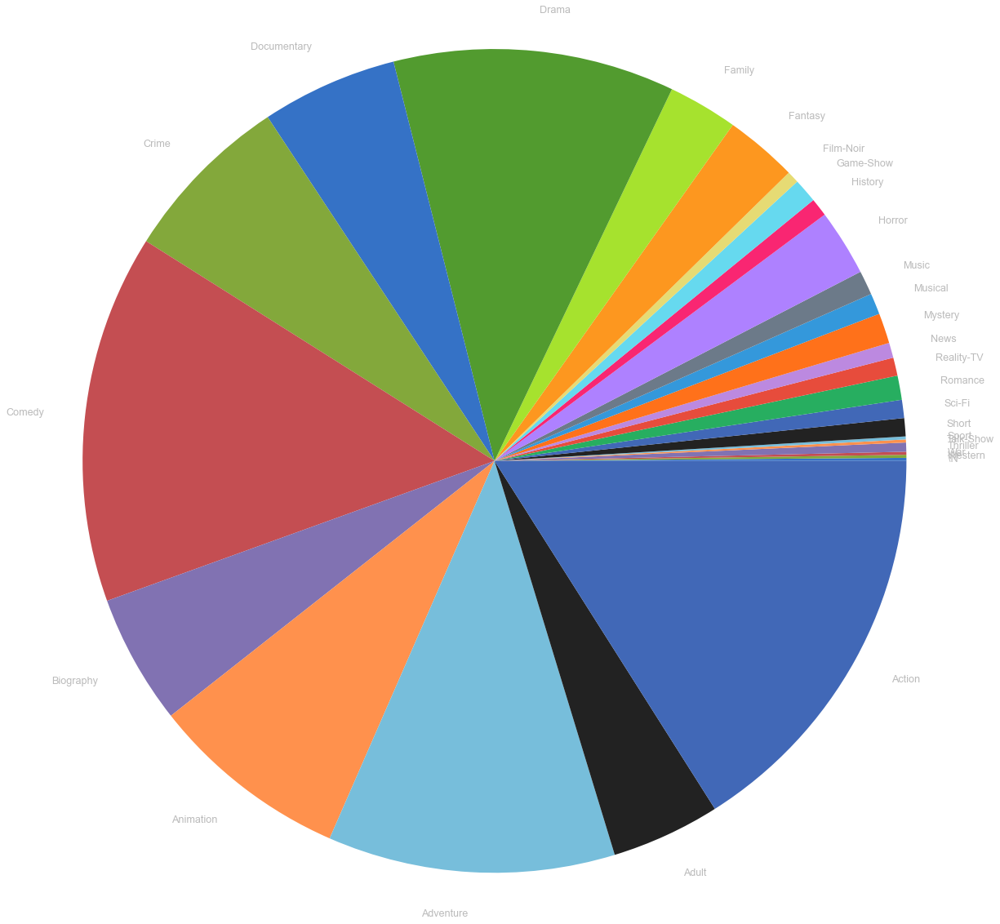

In [312]:
plt.pie(newnew['pass_test'], labels = newnew['genres_1'])
plt.axis('equal')
fig = plt.gcf()
fig.set_size_inches(20,20)
plt.show()

Yikes what a mess... lets fix this. i'll split all the csv genres, and make them into their own rows, and then group those all together.

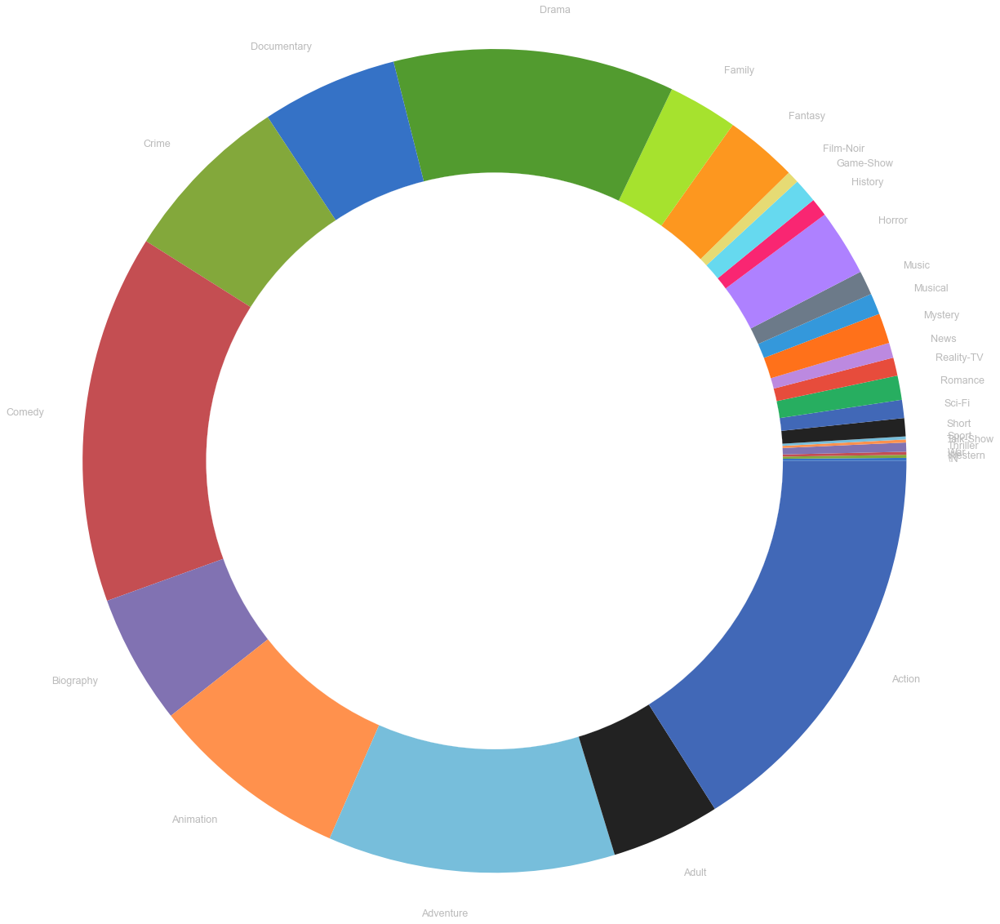

In [313]:
plt.pie(newnew['pass_test'], labels = newnew['genres_1'])
plt.axis('equal')
fig = plt.gcf()
fig.set_size_inches(20,20)

my_circle=plt.Circle( (0,0), 0.7, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()


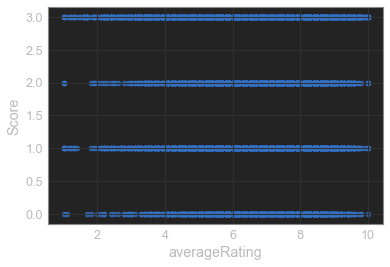

In [28]:
sns.regplot(x=df["averageRating"], y=df["Score"], fit_reg = False)


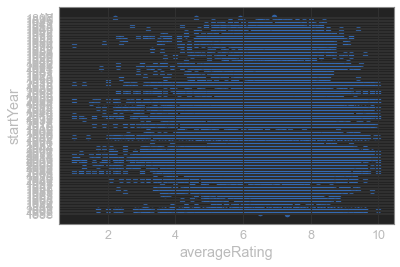

In [44]:


sns.regplot(x=df["averageRating"], y=df['startYear'], fit_reg=False) #scatter_kws={'facecolors':df['color']})


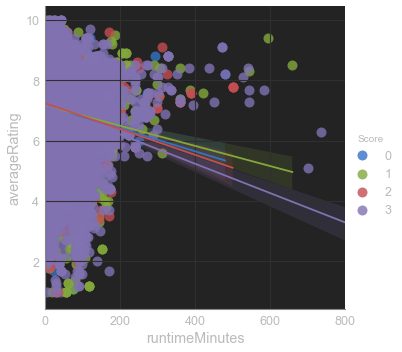

In [34]:
df['Score'] = pd.Categorical(df['Score'], ordered=True)
df['runtimeMinutes'] = pd.to_numeric(df.runtimeMinutes, errors = 'coerce')
g = sns.lmplot(x='runtimeMinutes', y='averageRating',data=df, hue='Score',scatter_kws={"s": 100})
g.set(xlim=(0,800))


In [51]:
import plotly.express as px

dfDropped = df.dropna()
fig = px.scatter(dfDropped, x="runtimeMinutes", y="averageRating", color="Score",
                 size='numVotes', hover_data=['pass_test'])
fig.show()

In [58]:
fig = px.scatter_3d(dfDropped, x="runtimeMinutes", y="averageRating", z= 'numVotes', color="Score", size='numVotes',
                  hover_data=['pass_test'])
fig.show()

In [81]:
df.head()

,id,title,imdbid,Score,year,pass_test,tconst,titleType,primaryTitle,originalTitle,isAdult,startYear,endYear,runtimeMinutes,genres,averageRating,numVotes
0,8040,Roundhay Garden Scene,0392728,0,1888,0,tt0392728,short,Roundhay Garden Scene,Roundhay Garden Scene,0.0,1888,\N,1.0,"Documentary,Short",7.3,5462.0
1,5433,Pauvre Pierrot,0000003,0,1892,0,tt0000003,short,Pauvre Pierrot,Pauvre Pierrot,0.0,1892,\N,4.0,"Animation,Comedy,Romance",6.5,1370.0
2,6200,"Execution of Mary, Queen of Scots, The",0132134,0,1895,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5444,Tables Turned on the Gardener,0000014,0,1895,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5406,Une nuit terrible,0000131,0,1896,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


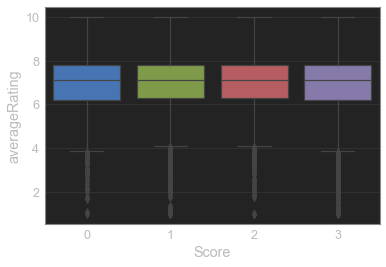

In [36]:
sns.boxplot(x="Score", y="averageRating", data=df)

In [43]:
newer['genres_1'] = pd.Categorical(newer['genres_1'], ordered=True)
sns.boxplot(x='genres_1, y='averageRating', data = df, hue='Score')

ValueError: Could not interpret input 'genres_1'

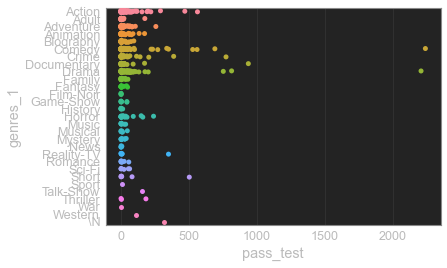

In [47]:
sns.stripplot(x="pass_test", y="genres_1", data=newer, jitter=True)

In [82]:
import plotly.express as px
import numpy as np
dfSlim4 = df.drop(columns=['originalTitle','titleType','isAdult','endYear','id','tconst','title','imdbid'])
dfSlim5 = dfSlim4.dropna()
dfSlim5.head()

newer = dfSlim5.groupby(['genres']).count() \
               .reset_index() \
               .sort_values(['genres'], ascending=False)
newest = newer["genres"].str.split(",", n = 1, expand = True)
newer['genres_1'] = newest[0]
newer['genres_2'] = newest[1]
newer.drop(columns=['genres', 'genres_2'], inplace= True )

newer.tail()

,Score,year,pass_test,primaryTitle,startYear,runtimeMinutes,averageRating,numVotes,genres_1
4,3,3,3,3,3,3,3,3,Action
3,1,1,1,1,1,1,1,1,Action
2,1,1,1,1,1,1,1,1,Action
1,1,1,1,1,1,1,1,1,Action
0,50,50,50,50,50,50,50,50,Action


In [85]:


fig = px.scatter_3d(newer, x='year', y='genres_1', z='averageRating', color='Score',
                    hover_data=['runtimeMinutes'])
fig.update_layout(scene_zaxis_type="log")
fig.show()